<a href="https://colab.research.google.com/github/yhcho0405/TensorFlow_Study/blob/main/AI_Study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 인공신경망(Artificial Neural Network)

* 인간 두뇌에 대한 계산적 모델을 통해 인공지능을 구현하려는 분야
* 인간의 뇌 구조를 모방: 뉴런과 뉴런 사이에는 전기신호를 통해 정보를 전달  

## 생물학적 신경세포와 인공신경망 비교

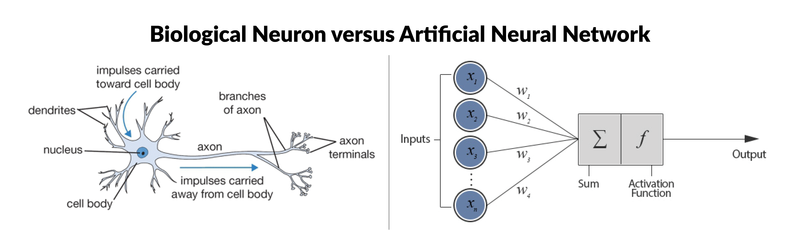

* 신경세포(Neuron)
  - 수상돌기(樹狀突起, Dendrite) : 다른 신경세포의 축색돌기와 연결되어 전기화학적 신호를 받아들이는 부위 
  - 축색돌기(軸索突起, Axon) : 수신한 전기화학적 신호의 합성결과 값이 특정 임계값이 이상이면 신호를 내보는 부위
  - 신경연접(神經連接, Synapse) : 수상돌기와 축색돌기 연결 부위, 전달되는 신호의 증폭 또는 감쇄 


* 인공 뉴런(Artificial Neuron)
  - 신경세포 구조를 단순화하여 모델링한 구조
  - 노드(Node)와 엣지(Edge)로 표현
  - 하나의 노드안에서 입력(Inputs)와 가중치(Weights)를 곱하고 더하는 선형구조(linear)
  - 활성화 함수(activation function)를 통한 비선형 구조(non-linear) 표현 가능

* 인공 신경망(Artificial Neural Network)
  - 여러 개의 인공뉴런들이 모여 연결된 형태
  - 뉴런들이 모인 하나의 단위를 층(layer)이라고 하고, 여러 층(multi layer)으로 이루어질 수 있음
  - ex) 입력층(input layer), 은닉층(hidden layer), 출력층(output layer)

# 딥러닝 프레임워크(Deep Learning Framework)

## 텐서플로우(Tensorflow)

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/1/11/TensorFlowLogo.svg/1200px-TensorFlowLogo.svg.png" width="300">

- 가장 널리 쓰이는 딥러닝 프레임워크 중 하나
- 구글이 주도적으로 개발하는 플랫폼
- 파이썬, C++ API를 기본적으로 제공하고,  
  자바스크립트(JavaScript), 자바(Java), 고(Go), 스위프트(Swift) 등 다양한 프로그래밍 언어를 지원
- tf.keras를 중심으로 고수준 API 통합 (2.x 버전)
- TPU(Tensor Processing Unit) 지원
  - TPU는 GPU보다 전력을 적게 소모, 경제적
  - 일반적으로 32비트(float32)로 수행되는 곱셈 연산을 16비트(float16)로 낮춤

## 케라스(Keras)

<img src="https://s3.amazonaws.com/keras.io/img/keras-logo-2018-large-1200.png" width="320">

- 파이썬으로 작성된 고수준 신경망 API로 TensorFlow, CNTK, 혹은 Theano와 함께 사용 가능
- 사용자 친화성, 모듈성, 확장성을 통해 빠르고 간편한 프로토타이핑 가능
- 컨볼루션 신경망, 순환 신경망, 그리고 둘의 조합까지 모두 지원
- CPU와 GPU에서 매끄럽게 실행

# 딥러닝 데이터 표현과 연산

* 데이터 표현을 위한 기본 구조로 텐서(tensor)를 사용
* 텐서는 데이터를 담기위한 컨테이너(container)로서 일반적으로 수치형 데이터를 저장

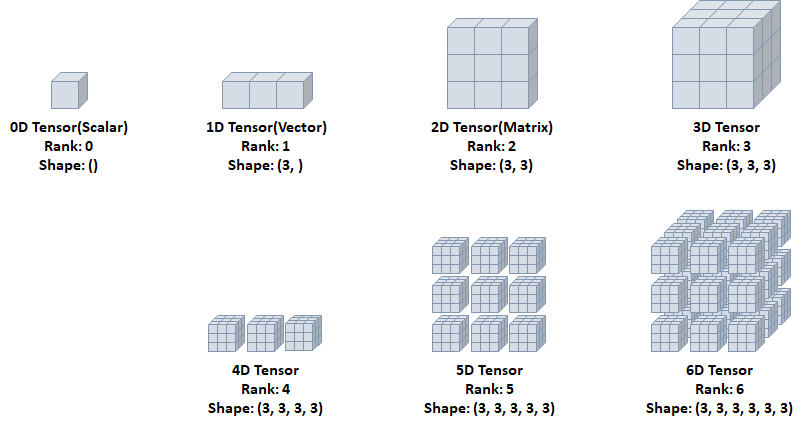

## 텐서(Tensor)

- Rank: 축의 개수
- Shape: 형상(각 축에 따른 차원 개수)
- Type: 데이터 타입

In [4]:
import numpy as np
import tensorflow as tf

### 0D Tensor(Scalar)

* 하나의 숫자를 담고 있는 텐서(tensor)
* 축과 형상이 없음

In [5]:
t0 = tf.constant(1)
print(t0)
print(tf.rank(t0))

tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)


### 1D Tensor(Vector)

* 값들을 저장한 리스트와 유사한 텐서
* 하나의 축이 존재

In [6]:
t1 = tf.constant([1, 2, 3])
print(t1)
print(tf.rank(t1))

tf.Tensor([1 2 3], shape=(3,), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)


### 2D Tensor(Matrix)

* 행렬과 같은 모양으로 두개의 축이 존재
* 일반적인 수치, 통계 데이터셋이 해당
* 주로 샘플(samples)과 특성(features)을 가진 구조로 사용

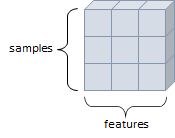

In [7]:
t2 = tf.constant([[1, 2, 3], 
                  [4, 5, 6], 
                  [7, 8, 9]])
print(t2)
print(tf.rank(t2))

tf.Tensor(
[[1 2 3]
 [4 5 6]
 [7 8 9]], shape=(3, 3), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)


### 3D Tensor

* 큐브(cube)와 같은 모양으로 세개의 축이 존재
* 데이터가 연속된 시퀀스 데이터나 시간 축이 포함된 시계열 데이터에 해당
* 주식 가격 데이터셋, 시간에 따른 질병 발병 데이터 등이 존재
* 주로 샘플(samples), 타임스텝(timesteps), 특성(features)을 가진 구조로 사용 

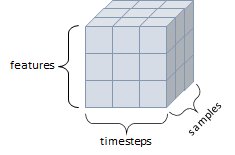

In [8]:
t3 = tf.constant([[[1, 2, 3], 
                   [4, 5, 6], 
                   [7, 8, 9]],
                   
                  [[1, 2, 3], 
                   [4, 5, 6], 
                   [7, 8, 9]],
                  
                  [[1, 2, 3], 
                   [4, 5, 6], 
                   [7, 8, 9]]])
print(t3)
print(tf.rank(t3))

tf.Tensor(
[[[1 2 3]
  [4 5 6]
  [7 8 9]]

 [[1 2 3]
  [4 5 6]
  [7 8 9]]

 [[1 2 3]
  [4 5 6]
  [7 8 9]]], shape=(3, 3, 3), dtype=int32)
tf.Tensor(3, shape=(), dtype=int32)


### 4D Tensor

* 4개의 축
* 컬러 이미지 데이터가 대표적인 사례 (흑백 이미지 데이터는 3D Tensor로 가능)
* 주로 샘플(samples), 높이(height), 너비(width), 컬러 채널(channel)을 가진 구조로 사용

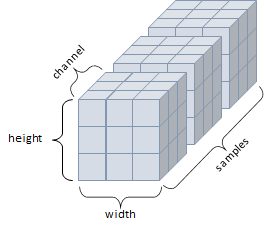

### 5D Tensor

* 5개의 축
* 비디오 데이터가 대표적인 사례
* 주로 샘플(samples), 프레임(frames), 높이(height), 너비(width), 컬러 채널(channel)을 가진 구조로 사용

## 텐서 데이터 타입

* 텐서의 기본 dtype
  - 정수형 텐서: `int32`
  - 실수형 텐서: `float32`
  - 문자열 텐서: `string`
* `int32`, `float32`,  `string` 타입 외에도 `float16`, `int8` 타입 등이 존재
* 연산시 텐서의 타입 일치 필요
* 타입변환에는 `tf.cast()` 사용

In [9]:
i = tf.constant(2)
print(i)

tf.Tensor(2, shape=(), dtype=int32)


In [10]:
f = tf.constant(2.)
print(f)

tf.Tensor(2.0, shape=(), dtype=float32)


In [11]:
s = tf.constant('hello')
print(s)

tf.Tensor(b'hello', shape=(), dtype=string)


In [12]:
f16 = tf.constant(2., dtype=tf.float16)
print(f16)

tf.Tensor(2.0, shape=(), dtype=float16)


In [13]:
i8 = tf.constant(2, dtype=tf.int8)
print(i8)

tf.Tensor(2, shape=(), dtype=int8)


In [14]:
f32 = tf.cast(f16, tf.float32)
print(f32)

tf.Tensor(2.0, shape=(), dtype=float32)


In [15]:
i32 = tf.cast(i8, tf.int32)
print(i32)

tf.Tensor(2, shape=(), dtype=int32)


## 텐서 연산

In [16]:
print(tf.constant(2) + tf.constant(2))
print(tf.constant(2) - tf.constant(2))
print(tf.add(tf.constant(2), tf.constant(2)))
print(tf.subtract(tf.constant(2), tf.constant(2)))

tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(0, shape=(), dtype=int32)


In [17]:
print(tf.constant(2) * tf.constant(2))
print(tf.constant(2) / tf.constant(2))
print(tf.multiply(tf.constant(2), tf.constant(2)))
print(tf.divide(tf.constant(2), tf.constant(2)))

tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(1.0, shape=(), dtype=float64)
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(1.0, shape=(), dtype=float64)


In [18]:
print(tf.cast(tf.constant(2), tf.float32) + tf.constant(2.2))

tf.Tensor(4.2, shape=(), dtype=float32)


# 딥러닝 구조 및 학습

* 딥러닝 구조와 학습에 필요한 요소
  - **모델(네트워크)**를 구성하는 **레이어(layer)**
  - **입력 데이터**와 그에 대한 **목적(결과)**
  - 학습시에 사용할 피드백을 정의하는 **손실 함수(loss function)**
  - 학습 진행 방식을 결정하는 **옵티마이저(optimizer)**

## 레이어(Layer)

* 신경망의 핵심 데이터 구조
* 하나 이상의 텐서를 입력받아 하나 이상의 텐서를 출력하는 데이터 처리 모듈
* 상태가 없는 레이어도 있지만, 대부분 **가중치(weight)**라는 레이어 상태를 가짐
* 가중치는 확률적 경사 하강법에 의해 학습되는 하나 이상의 텐서

* Keras에서 사용되는 주요 레이어
  - Dense
  - Activation
  - Flatten
  - Input

In [19]:
from tensorflow.keras.layers import Dense, Activation, Flatten, Input

### Dense

* 완전연결계층(Fully-Connected Layer)
* 노드수(유닛수), 활성화 함수(`activation`) 등을 지정
* `name`을 통한 레이어간 구분 가능

* 가중치 초기화(`kernel_initializer`)
  - 신경망의 성능에 큰 영향을 주는 요소  
  - 보통 가중치의 초기값으로 0에 가까운 무작위 값 사용
  - 특정 구조의 신경망을 동일한 학습 데이터로 학습시키더라도, 가중치의 초기값에 따라 학습된 신경망의 성능 차이가 날 수 있음
  - 오차역전파 알고리즘은 기본적으로 경사하강법을 사용하기 때문에 최적해가 아닌 지역해에 빠질 가능성이 있음
  - Keras에서는 기본적으로 Glorot uniform 가중치(Xavier 분포 초기화), zeros bias로 초기화
  - `kernel_initializer` 인자를 통해 다른 가중치 초기화 지정 가능
  - Keras에서 제공하는 가중치 초기화 종류: https://keras.io/api/layers/initializers/

In [20]:
Dense(10, activation='softmax')

In [21]:
Dense(10, activation='relu', name='Dense Layer')

In [22]:
Dense(10, kernel_initializer='he_normal', name='Dense Layer')

### Activation

- Dense layer에서 미리 활성화 함수를 지정할 수도 있지만 필요에 따라 별도 레이어를 만들어줄 수 있음
- Keras에서 제공하는 활성화 함수(activation function) 종류: https://keras.io/ko/activations/

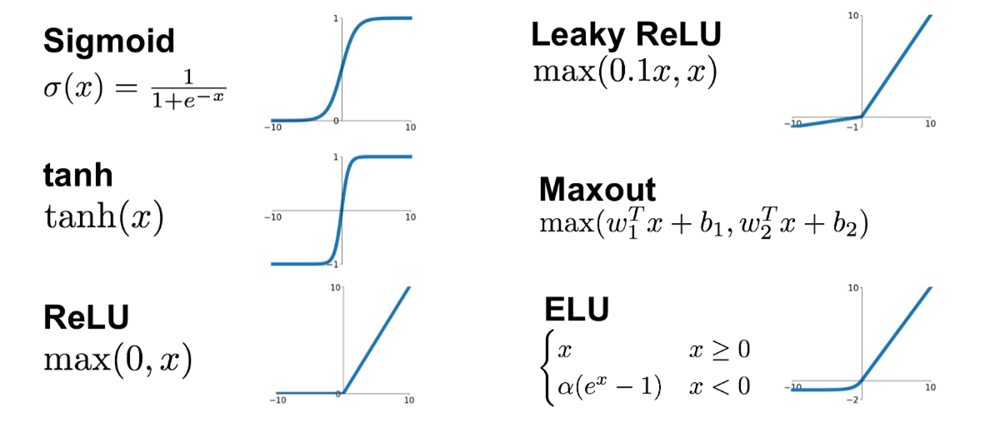

In [23]:
dense = Dense(10, activation='relu', name='Dense Layer')
Activation(dense)

### Flatten

- 배치 크기(또는 데이터 크기)를 제외하고 데이터를 1차원으로 쭉 펼치는 작업
- 예시)
        (128, 3, 2, 2) -> (128, 12)
      

In [24]:
Flatten(input_shape=(128, 3, 2, 2))

### Input 

- 모델의 입력을 정의
- `shape`, `dtype`을 포함
- 하나의 모델은 여러 개의 입력을 가질 수 있음
- `summary()` 메소드를 통해서는 보이지 않음

In [25]:
Input(shape=(28, 28), dtype=tf.float32)

<KerasTensor: shape=(None, 28, 28) dtype=float32 (created by layer 'input_1')>

In [26]:
Input(shape=(8, ), dtype=tf.int32)

<KerasTensor: shape=(None, 8) dtype=int32 (created by layer 'input_2')>

## 모델(Model)

* 딥러닝 모델은 레이어로 만들어진 비순환 유향 그래프(Directed Acyclic Graph, DAG) 구조

### 모델 구성

  - `Sequential()`
  - 서브클래싱(Subclassing)
  - 함수형 API

#### Sequential()

- 모델이 순차적인 구조로 진행할 때 사용
- 간단한 방법
  - Sequential 객체 생성 후,`add()`를 이용한 방법
  - Sequential 인자에 한번에 추가 방법
- 다중 입력 및 출력이 존재하는 등의 복잡한 모델을 구성할 수 없음


In [27]:
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.utils import plot_model

In [28]:
model = Sequential()
model.add(Input(shape=(28, 28)))
model.add(Dense(300, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 28, 300)           8700      
                                                                 
 dense_2 (Dense)             (None, 28, 100)           30100     
                                                                 
 dense_3 (Dense)             (None, 28, 10)            1010      
                                                                 
Total params: 39,810
Trainable params: 39,810
Non-trainable params: 0
_________________________________________________________________


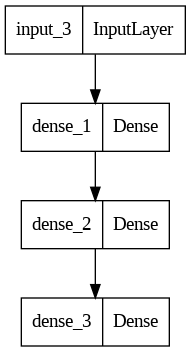

In [29]:
plot_model(model)

In [30]:
model = Sequential([Input(shape=(28, 28), name='input'), 
                   Dense(300, activation='relu', name='Dense1'),
                   Dense(100, activation='relu', name='Dense2'), 
                   Dense(10, activation='softmax', name='Output')])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense1 (Dense)              (None, 28, 300)           8700      
                                                                 
 Dense2 (Dense)              (None, 28, 100)           30100     
                                                                 
 Output (Dense)              (None, 28, 10)            1010      
                                                                 
Total params: 39,810
Trainable params: 39,810
Non-trainable params: 0
_________________________________________________________________


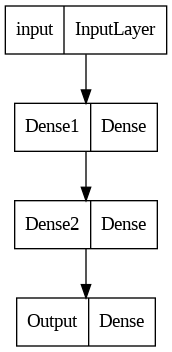

In [31]:
plot_model(model)

#### 함수형 API

- 가장 권장되는 방법
- 모델을 복잡하고, 유연하게 구성 가능
- 다중 입출력을 다룰 수 있음

In [32]:
inputs = Input(shape=(28, 28, 1))
x = Flatten(input_shape=(28, 28, 1))(inputs)
x = Dense(300, activation='relu')(x)
x = Dense(100, activation='relu')(x)
x = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=x)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_4 (Dense)             (None, 300)               235500    
                                                                 
 dense_5 (Dense)             (None, 100)               30100     
                                                                 
 dense_6 (Dense)             (None, 10)                1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


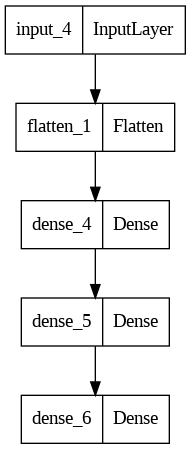

In [33]:
plot_model(model)

In [34]:
from tensorflow.keras.layers import Concatenate

input_layer = Input(shape=(28, 28))
hidden1 = Dense(100, activation='relu')(input_layer)
hidden2 = Dense(30, activation='relu')(hidden1)
concat = Concatenate()([input_layer, hidden2])
output = Dense(1)(concat)

model = Model(inputs=[input_layer], outputs=[output])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 28, 28)]     0           []                               
                                                                                                  
 dense_7 (Dense)                (None, 28, 100)      2900        ['input_5[0][0]']                
                                                                                                  
 dense_8 (Dense)                (None, 28, 30)       3030        ['dense_7[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 28, 58)       0           ['input_5[0][0]',                
                                                                  'dense_8[0][0]']          

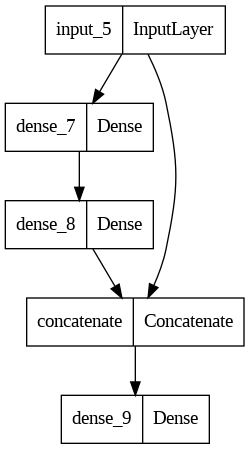

In [35]:
plot_model(model)

In [36]:
input_1 = Input(shape=(10, 10), name='input_1')
input_2 = Input(shape=(10, 28), name='input_2')

hidden1 = Dense(100, activation='relu')(input_2)
hidden2 = Dense(10, activation='relu')(hidden1)
concat = Concatenate()([input_1, hidden2])
output = Dense(1, activation='sigmoid', name='output')(concat)

model = Model(inputs=[input_1, input_2], outputs=[output])
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 10, 28)]     0           []                               
                                                                                                  
 dense_10 (Dense)               (None, 10, 100)      2900        ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_11 (Dense)               (None, 10, 10)       1010        ['dense_10[0][0]']               
                                                                                            

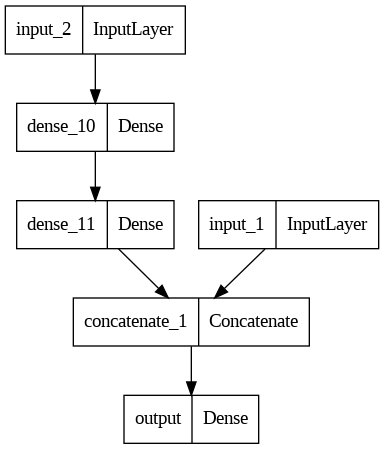

In [37]:
plot_model(model)

In [38]:
input_ =  Input(shape=(10, 10), name='input_')
hidden1 = Dense(100, activation='relu')(input_)
hidden2 = Dense(10, activation='relu')(hidden1)
output = Dense(1, activation='sigmoid', name='main_output')(hidden2)
sub_out = Dense(1, name='sub_output')(hidden2)

model = Model(inputs=[input_], outputs=[output, sub_out])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_ (InputLayer)            [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_12 (Dense)               (None, 10, 100)      1100        ['input_[0][0]']                 
                                                                                                  
 dense_13 (Dense)               (None, 10, 10)       1010        ['dense_12[0][0]']               
                                                                                                  
 main_output (Dense)            (None, 10, 1)        11          ['dense_13[0][0]']               
                                                                                            

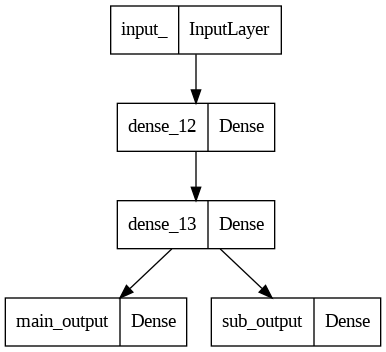

In [39]:
plot_model(model)

In [40]:
input_1 = Input(shape=(10, 10), name='input_1')
input_2 = Input(shape=(10, 28), name='input_2')
hidden1 = Dense(100, activation='relu')(input_2)
hidden2 = Dense(10, activation='relu')(hidden1)
concat = Concatenate()([input_1, hidden2])
output = Dense(1, activation='sigmoid', name='main_output')(concat)
sub_out = Dense(1, name='sub_output')(hidden2)

model = Model(inputs=[input_1, input_2], outputs=[output, sub_out])
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 10, 28)]     0           []                               
                                                                                                  
 dense_14 (Dense)               (None, 10, 100)      2900        ['input_2[0][0]']                
                                                                                                  
 input_1 (InputLayer)           [(None, 10, 10)]     0           []                               
                                                                                                  
 dense_15 (Dense)               (None, 10, 10)       1010        ['dense_14[0][0]']               
                                                                                            

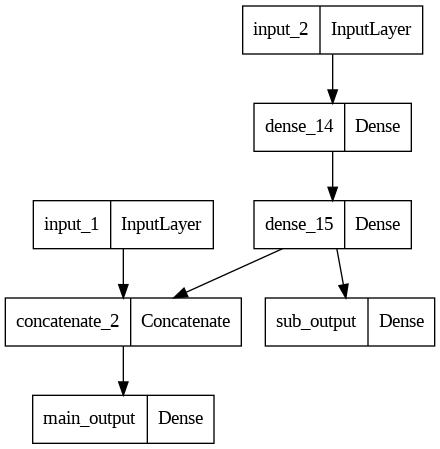

In [41]:
plot_model(model)

#### 서브클래싱(Subclassing)

- 커스터마이징에 최적화된 방법
- Model 클래스를 상속받아 Model이 포함하는 기능을 사용할 수 있음  
  - `fit()`, `evaluate()`, `predict()`
  - `save()`, `load()`
- 주로 `call()` 메소드안에서 원하는 계산 가능
  - for, if, 저수준 연산 등
- 권장되는 방법은 아니지만 어떤 모델의 구현 코드를 참고할 때, 해석할 수 있어야함

In [42]:
class MyModel(Model):
    def __init__(self, units=30, activation='relu', **kwargs):
        super(MyModel, self).__init__(**kwargs)
        self.dense_layer1 = Dense(300, activation=activation)
        self.dense_layer2 = Dense(100, activation=activation)
        self.dense_layer3 = Dense(units, activation=activation)
        self.output_layer = Dense(10, activation='softmax')
        
    def call(self, inputs):
        x = self.dense_layer1(inputs)
        x = self.dense_layer2(x)
        x = self.dense_layer3(x)
        x = self.output_layer(x)
        return x

### 모델 가중치 확인

In [43]:
inputs = Input(shape=(28, 28, 1))
x = Flatten(input_shape=(28, 28, 1))(inputs)
x = Dense(300, activation='relu')(x)
x = Dense(100, activation='relu')(x)
x = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=x)
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_16 (Dense)            (None, 300)               235500    
                                                                 
 dense_17 (Dense)            (None, 100)               30100     
                                                                 
 dense_18 (Dense)            (None, 10)                1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


In [44]:
model.layers

In [45]:
hidden_2 = model.layers[2]
hidden_2.name

'dense_16'

In [46]:
model.get_layer('dense_16') is hidden_2

True

In [47]:
weights, biases = hidden_2.get_weights()
print(weights.shape)
print(biases.shape)

(784, 300)
(300,)


In [48]:
print(weights)

[[-0.04192654  0.05545329  0.05543832 ... -0.02509     0.0081622
  -0.00462933]
 [-0.02061025  0.04102869  0.03943802 ... -0.00810629  0.03143006
  -0.0239251 ]
 [ 0.05344708  0.00106395  0.03641883 ...  0.0087821   0.03776451
  -0.04582266]
 ...
 [-0.0576539   0.03402074 -0.06680495 ... -0.05406159  0.01575689
   0.00996188]
 [-0.01588549 -0.00820728 -0.0454637  ...  0.06207836 -0.03403389
   0.01944078]
 [-0.01824684 -0.04452473 -0.04669646 ... -0.00833071 -0.00706784
  -0.04390555]]


In [49]:
print(biases)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


### 모델 컴파일(compile)

- 모델을 구성한 후, 사용할 손실 함수(loss function), 옵티마이저(optimizer)를 지정


In [50]:
model.compile(loss='sparse_categorical_crossentropy', 
              optimizer='sgd', 
              metrics=['accuracy'])

#### 손실 함수(Loss Function)

* 학습이 진행되면서 해당 과정이 얼마나 잘 되고 있는지 나타내는 지표
* 모델이 훈련되는 동안 최소화될 값으로 주어진 문제에 대한 성공 지표
* 손실 함수에 따른 결과를 통해 학습 파라미터를 조정
* 최적화 이론에서 최소화 하고자 하는 함수
* 미분 가능한 함수 사용
* Keras에서 주요 손실 함수 제공
  - `sparse_categorical_crossentropy`: 클래스가 배타적 방식으로 구분, 즉 (0, 1, 2, ..., 9)와 같은 방식으로 구분되어 있을 때 사용
  - `categorical_cross_entropy`: 클래스가 원-핫 인코딩 방식으로 되어 있을 때 사용
  - `binary_crossentropy`: 이진 분류를 수행할 때 사용

##### 평균절대오차(Mean Absolute Error, MAE)

* 오차가 커져도 손실함수가 일정하게 증가
* 이상치(Outlier)에 강건함(Robust)
  -  데이터에서 [입력 - 정답] 관계가 적절하지 않은 것이 있을 경우에, 좋은 추정을 하더라도 오차가 발생하는 경우가 발생
  - 해당 이상치에 해당하는 지점에서 손실 함수의 최소값으로 가는 정도의 영향력이 크지 않음
* 회귀 (Regression)에 많이 사용
* 평균절대오차 식:
$ \qquad \qquad E = \frac{1}{n}\sum_{i=1}^n \left | y_i - \tilde{y}_i \right |$
  - $y_i$ : 학습 데이터의 $i\ $번째 정답
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

![](https://miro.medium.com/max/1152/1*8BQhdKu1nk-tAAbOR17qGg.png)
<br />

##### 평균제곱오차(Mean Squared Error, MSE)

* 가장 많이 쓰이는 손실 함수 중 하나
* 오차가 커질수록 손실함수가 빠르게 증가
  - 정답과 예측한 값의 차이가 클수록 더 많은 페널티를 부여
* 회귀 (Regression)에 쓰임
* 평균제곱오차 식: $ \qquad \qquad E = \frac{1}{n}\sum_{i=1}^n ( y_i - \tilde{y}_i)^2 $
  - $y_i$ : 학습 데이터의 $i\ $번째 정답
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

![](https://miro.medium.com/max/1152/1*EqTaoCB1NmJnsRYEezSACA.png)
<br />


##### 손실함수 MAE와 MSE 비교

![](https://miro.medium.com/max/1400/1*JTC4ReFwSeAt3kvTLq1YoA.png)
<br />

##### 원-핫 인코딩(One-Hot Encoding)

- 범주형 변수를 표현할 때 사용
- 가변수(Dummy Variable)이라고도 함
- 정답인 레이블을 제외하고 0으로 처리

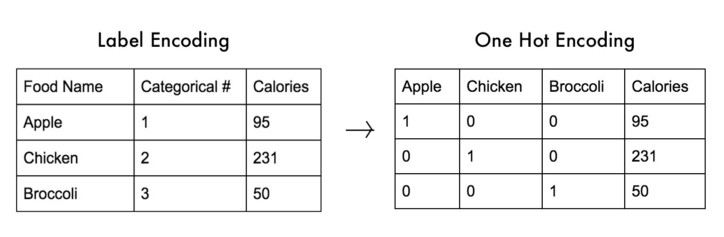

##### 교차 엔트로피 오차(Cross Entropy Error, CEE)

* 이진 분류(Binary Classification), 다중 클래스 분류(Multi Class Classification)
* 소프트맥스(softmax)와 원-핫 인코딩(ont-hot encoding) 사이의 출력 간 거리를 비교
* 정답인 클래스에 대해서만 오차를 계산
* 정답을 맞추면 오차가 0, 틀리면 그 차이가 클수록 오차가 무한히 커짐
* $y = log(x)$
  - $x$가 1에 가까울수록 0에 가까워짐
  - $x$가 0에 가까울수록 $y$값은 무한히 커짐


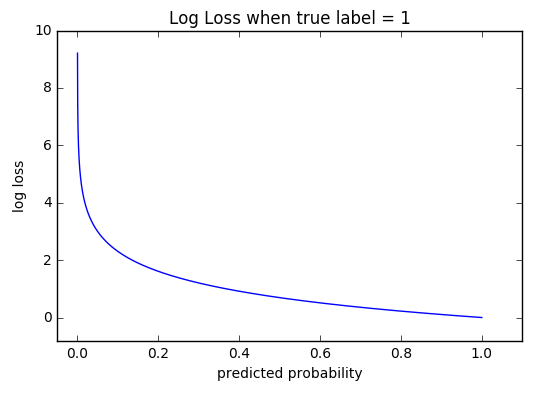

* 교차 엔트로피 오차 식: $ \qquad \qquad E = - \frac{1}{N}\sum_{n} \sum_{i}  y_i\ log\tilde{y}_i  $ 
  - $y_i$ : 학습 데이터의 $i\ $번째 정답 (원-핫 인코딩, one-hot encoding)
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력
  - $N$ : 전체 데이터의 개수
  - $i$ : 데이터 하나당 클래스 개수

* 정답 레이블($y_i$)은 원-핫 인코딩으로 정답인 인덱스에만 1이고, 나머지는 모두 0이라서 다음과 같이 나타낼 수 있음

 $ \qquad \qquad E = - log\tilde{y}_i  $

  - 소프트맥스를 통해 나온 신경망 출력이 0.6이라면 $\ -log0.6 \fallingdotseq -0.51\ $이 되고, 신경망 출력이 0.3이라면  $\ -log0.3 \fallingdotseq -1.2\ $이 됨
  - 정답에 가까워질수록 오차값은 작아짐
  - 학습시, 원-핫 인코딩에 의해 정답 인덱스만 살아 남아 비교하지만, 정답이 아닌 인덱스들도 학습에 영향을 미침. 왜냐하면 다중 클래스 분류는 소프트맥스(softmax) 함수를 통해 전체 항들을 모두 다루기 때문

##### 이진 분류 문제의 교차 크로스 엔트로피(Binary Cross Entropy, BCE)

* 이진 분류 문제(Binary Classification Problem)에서도 크로스 엔트로피 오차를 손실함수로 사용 가능
$ \qquad \qquad E = - \sum_{i=1}^2  y_i\ log\tilde{y}_i \\ 
\qquad \qquad \ \ \ = -y_1\ log\ \tilde{y}_1 - (1 - y_1)log(1-\ \tilde{y}_1) $  
$\qquad \qquad \qquad ( \because y_2 = 1 - y_1)$
  - $y_i$ : 학습 데이터의 $i\ $번째 정답 (원-핫 인코딩, one-hot encoding)
  - $\tilde{y}_i$ : 학습 데이터의 입력으로 추정한 $i\ $번째 출력

* 2개의 클래스를 분류하는 문제에서 1번이 정답일 확률이 0.8이고, 실제로 정답이 맞다면 다음과 같이 나타낼 수 있음

### $ \qquad \qquad E = -y_1\ log\ \tilde{y}_1 - (1 - y_1)\ log\ (1-\ \tilde{y}_1) \\
\qquad \qquad \ \ \ = -1\ log\ 0.8 - (1 - 1)\ log\ (1 - 0.8)\\ 
\qquad \qquad \ \ \ = -log\ 0.8 \\
\qquad \qquad \ \ \ \fallingdotseq -0.22
$

* 반대로, 실제로 정답이 2번이었다면, 식은 다음과 같이 나타낼 수 있음

### $ \qquad \qquad E = -y_1\ log\ \tilde{y}_1 - (1 - y_1)\ log\ (1-\ \tilde{y}_1) \\
\qquad \qquad \ \ \ = -0\ log\ 0.8 - (1 - 0)\ log\ (1 - 0.8)\\ 
\qquad \qquad \ \ \ = -log\ 0.2 \\
\qquad \qquad \ \ \ \fallingdotseq -1.61
$  



#### 옵티마이저(Optimizer)

* 손실 함수를 기반으로 모델이 어떻게 업데이트되어야 하는지 결정 (특정 종류의 확률적 경사 하강법 구현)
* Keras에서 여러 옵티마이저 제공
  - `keras.optimizer.SGD()`: 기본적인 확률적 경사 하강법
  - `keras.optimizer.Adam()`: 자주 사용되는 옵티마이저
  - Keras에서 사용되는 옵티마이저 종류: https://keras.io/ko/optimizers/
* 보통 옵티마이저의 튜닝을 위해 따로 객체를 생성하여 컴파일    


##### 볼록함수(Convex Function)와 비볼록함수(Non-Convex Function)

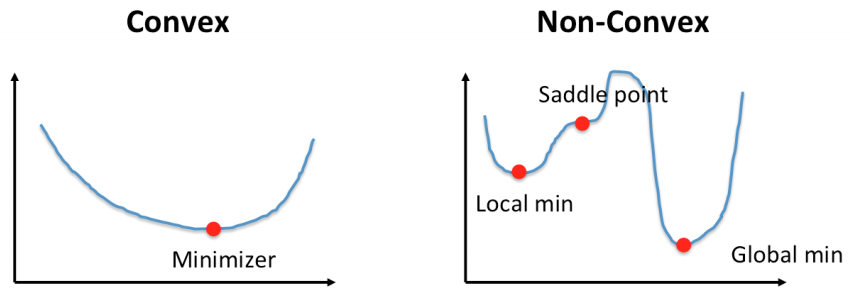

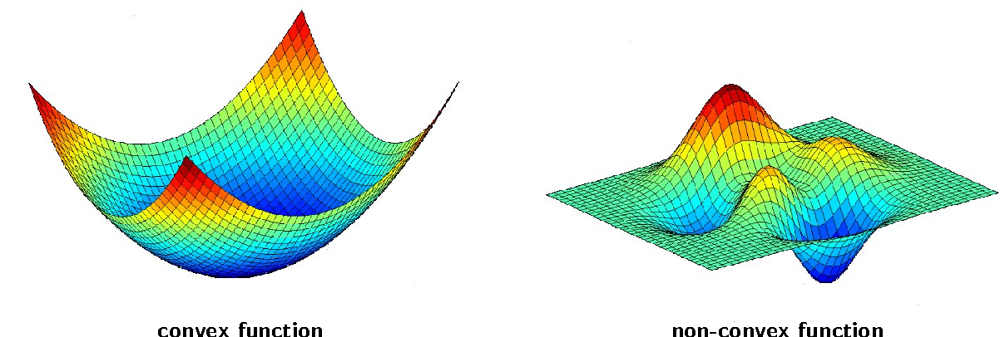

* 볼록함수(Convex Function)
  - 어떤 지점에서 시작하더라도 최적값(손실함수가 최소로하는 점)에 도달할 수 있음
* 비볼록함수(Non-Convex Function)
  - 비볼록 함수는 시작점 위치에 따라 다른 최적값에 도달할 수 있음



##### 경사하강법(Gradient Decent)

* 미분과 기울기
  - 스칼라를 벡터로 미분한 것

## $\quad \frac{df(x)}{dx} = \lim_{\triangle x \to 0} \frac{f(x+\triangle x) - f(x)}{\triangle x}$

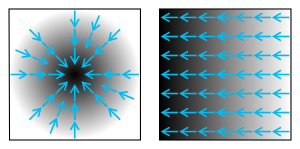

 $\quad \triangledown f(x) = \left( \frac{\partial f}{\partial x_1}, \frac{\partial f}{\partial x_2},\ ... \ , \frac{\partial f}{\partial x_N} \right)$
  - 변화가 있는 지점에서는 미분값이 존재하고, 변화가 없는 지점은 미분값이 0
  - 미분값이 클수록 변화량이 크다는 의미


* 경사하강법의 과정
- 경사하강법은 한 스텝마다의 미분값에 따라 이동하는 방향을 결정
- $f(x)$의 값이 변하지 않을 때까지 반복
  
  $\qquad x_n = x_{n-1} - \eta \frac{\partial f}{\partial x}$
    - $\eta$ : 학습률(learning rate)
- 즉, **미분값이 0인 지점**을 찾는 방법  

<img src="https://thumbs.gfycat.com/AngryInconsequentialDiplodocus-size_restricted.gif">

##### 학습률(learning rate)

- 적절한 학습률을 지정해야 최저점에 잘 도달할 수 있음
- 학습률이 너무 크면 발산하고, 너무 작으면 학습이 오래 걸리거나 최저점에 도달하지 않음

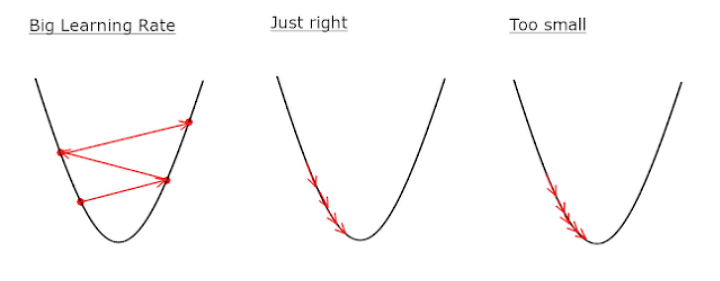

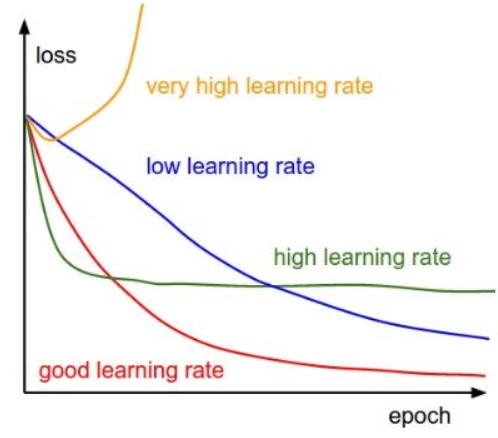

##### 안장점(Saddle Point)

- 기울기가 0이지만 극값이 되지 않음
- 경사하강법은 안장점에서 벗어나지 못함

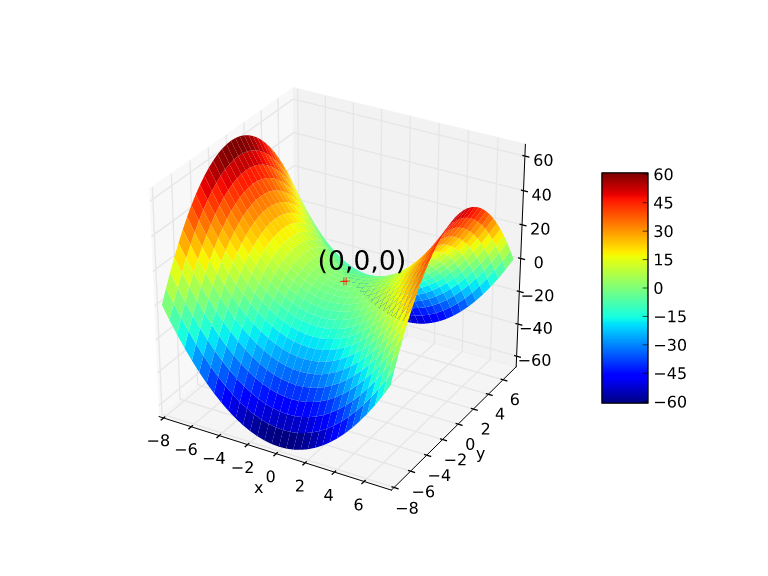

#### 지표(Metrics)

- 모니터링할 지표
- `mae`나 `accuracy` 사용
- 줄여서 `acc`로도 사용 가능
- Keras에서 사용되는 지표 종류: https://keras.io/ko/metrics/

### 모델 학습, 평가 및 예측

- `fit()`
  - `x`: 학습 데이터
  - `y`: 학습 데이터 정답 레이블
  - `epochs`: 학습 회수
  - `batch_size`: 단일 배치에 있는 학습 데이터의 크기
  - `validation_data`: 검증을 위한 데이터
- `evaluate()`
  - 테스트 데이터를 이용한 평가
- `predict()`
  - 임의의 데이터를 사용해 예측

#### 오차역전파 (Backpropagation)

* 오차역전파 알고리즘
  - 학습 데이터로 정방향(forward) 연산을 통해 손실함수 값(loss)을 구함
  - 각 layer별로 역전파학습을 위해 중간값을 저장
  - 손실함수를 학습 파라미터(가중치, 편향)로 미분하여 마지막 layer로부터 앞으로 하나씩 연쇄법칙을 이용하여 미분
  - 각 layer를 통과할 때마다 저장된 값을 이용
  - 오류(error)를 전달하면서 학습 파라미터를 조금씩 갱신

* 오차역전파 학습의 특징
  - 손실함수를 통한 평가를 한 번만 하고, 연쇄법칙을 이용한 미분을 활용하기 때문에 학습 소요시간이 매우 단축
  - 미분을 위한 중간값을 모두 저장하기 때문에 메모리를 많이 사용

* 신경망 학습에 있어서 미분가능의 중요성
  - 경사하강법(Gradient Descent)에서 손실 함수(cost function)의 최소값, 즉, 최적값을 찾기 위한 방법으로 미분을 활용
  - 미분을 통해 손실 함수의 학습 매개변수(trainable parameter)를 갱신하여 모델의 가중치의 최적값을 찾는 과정

![](https://i.pinimg.com/originals/5d/13/20/5d1320c7b672710834e63b95a7c1037b.png)


* 합성함수의 미분 (연쇄법칙, chain rule)

  $\qquad \frac{d}{dx} [f(g(x))] = f^\prime(g(x))g^\prime(x)$  
 
  - 여러개를 연속으로 사용 가능

  $ \quad \frac{\partial f}{\partial x} = \frac{\partial f}{\partial u} \times \frac{\partial u}{\partial m} \times \frac{\partial m}{\partial n} \times \ ... \ \frac{\partial l}{\partial k} \times \frac{\partial k}{\partial g} \times \frac{\partial g}{\partial x} 
  $

  - 각각에 대해 편미분 적용가능

![](https://cdn-media-1.freecodecamp.org/images/1*_KMMFvRP5X9kC59brI0ykw.png)

* 오차역전파의 직관적 이해
  - 학습을 진행하면서, 즉 손실함수의 최소값(minimum)을 찾아가는 과정에서 가중치 또는 편향의 변화에 따라 얼마나 영향을 받는지 알 수 있음



### MNIST 딥러닝 모델 예제

- 손으로 쓴 숫자들로 이루어진 이미지 데이터셋
- 기계 학습 분야의 트레이닝 및 테스트에 널리 사용되는 데이터
- keras.datasets에 기본으로 포함되어 있는 데이터셋

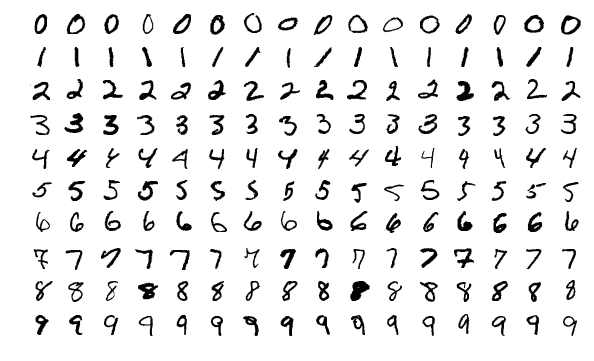

#### 모듈 임포트

In [51]:
import tensorflow as tf
from tensorflow.keras.datasets.mnist import load_data
from tensorflow.keras.models import Sequential
from tensorflow.keras import models
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.utils import to_categorical, plot_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

<ipython-input-51-b4b1746eba21>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


#### 데이터 로드 및 전처리

- MNIST 데이터셋을 로드
- Train Data 중, 30%를 검증 데이터(validation data)로 사용


In [52]:
tf.random.set_seed(111)

(x_train_full, y_train_full), (x_test, y_test) = load_data(path='mnist.npz')

x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, 
                                                  test_size=0.3, 
                                                  random_state=111)

11490434/11490434 [==============================] - 1s 0us/step


In [53]:
num_x_train = (x_train.shape[0])
num_x_val = (x_val.shape[0])
num_x_test = (x_test.shape[0])

print("total train data: \t{}\t\tlabel: {}".format(x_train_full.shape, y_train_full.shape))
print("train data: \t\t{}\t\tlabel: {}".format(x_train.shape, y_train.shape))
print("validation data: \t{}\t\tlabel: {}".format(x_val.shape, y_val.shape))
print("test data: \t\t{}\t\tlabel: {}".format(x_test.shape, y_test.shape))

total train data: 	(60000, 28, 28)		label: (60000,)
train data: 		(42000, 28, 28)		label: (42000,)
validation data: 	(18000, 28, 28)		label: (18000,)
test data: 		(10000, 28, 28)		label: (10000,)


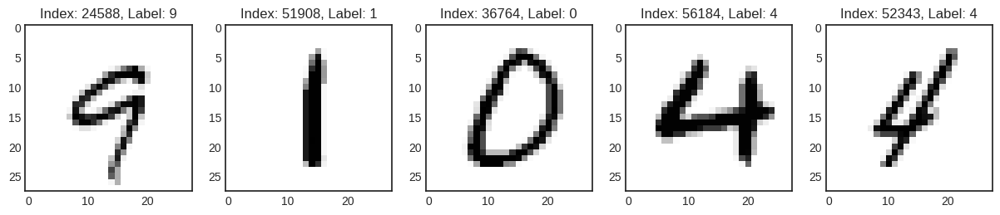

In [54]:
num_sample = 5
random_idxs = np.random.randint(60000, size=num_sample)

plt.figure(figsize=(15, 3))
for i, idx in enumerate(random_idxs):
    img = x_train_full[idx, :]
    label = y_train_full[idx]
    
    plt.subplot(1, len(random_idxs), i+1)
    plt.imshow(img)
    plt.title('Index: {}, Label: {}'.format(idx, label))

In [55]:
x_train = x_train / 255.
x_val = x_val/ 255.
x_test = x_test / 255.

y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
y_test = to_categorical(y_test)

#### 모델 구성(Sequential)

In [56]:
model = Sequential([Input(shape=(28, 28), name='input'), 
                    Flatten(input_shape=[28,28], name='flatten'), 
                    Dense(100, activation='relu', name='dense1'), 
                    Dense(64, activation='relu', name='dense2'), 
                    Dense(32, activation='relu', name='dense3'),
                    Dense(10, activation='softmax', name='output')])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense1 (Dense)              (None, 100)               78500     
                                                                 
 dense2 (Dense)              (None, 64)                6464      
                                                                 
 dense3 (Dense)              (None, 32)                2080      
                                                                 
 output (Dense)              (None, 10)                330       
                                                                 
Total params: 87,374
Trainable params: 87,374
Non-trainable params: 0
_________________________________________________________________


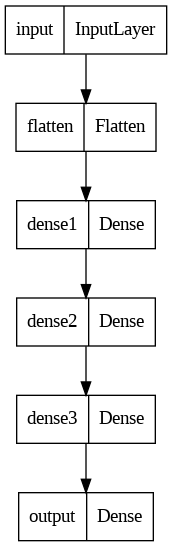

In [57]:
plot_model(model)

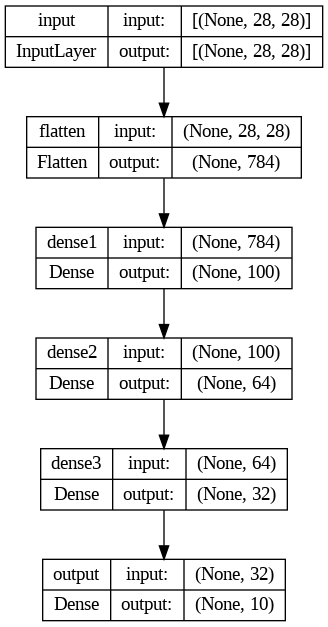

In [58]:
plot_model(model, show_shapes=True)

#### 모델 컴파일 및 학습

In [59]:
model.compile(loss='categorical_crossentropy', 
              optimizer='sgd', 
              metrics=['accuracy'])

In [60]:
history = model.fit(x_train, y_train,
                    epochs=50,
                    batch_size=128,
                    validation_data=(x_val, y_val))

Epoch 1/50
329/329 [==============================] - 8s 7ms/step - loss: 1.7602 - accuracy: 0.4756 - val_loss: 1.0642 - val_accuracy: 0.7267
Epoch 2/50
329/329 [==============================] - 2s 5ms/step - loss: 0.7326 - accuracy: 0.8141 - val_loss: 0.5513 - val_accuracy: 0.8467
Epoch 3/50
329/329 [==============================] - 1s 4ms/step - loss: 0.4676 - accuracy: 0.8719 - val_loss: 0.4173 - val_accuracy: 0.8841
Epoch 4/50
329/329 [==============================] - 1s 5ms/step - loss: 0.3840 - accuracy: 0.8910 - val_loss: 0.3640 - val_accuracy: 0.8973
Epoch 5/50
329/329 [==============================] - 2s 5ms/step - loss: 0.3418 - accuracy: 0.9014 - val_loss: 0.3322 - val_accuracy: 0.9031
Epoch 6/50
329/329 [==============================] - 1s 4ms/step - loss: 0.3144 - accuracy: 0.9098 - val_loss: 0.3200 - val_accuracy: 0.9071
Epoch 7/50
329/329 [==============================] - 1s 4ms/step - loss: 0.2935 - accuracy: 0.9151 - val_loss: 0.3116 - val_accuracy: 0.9090
Epoch 

In [61]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

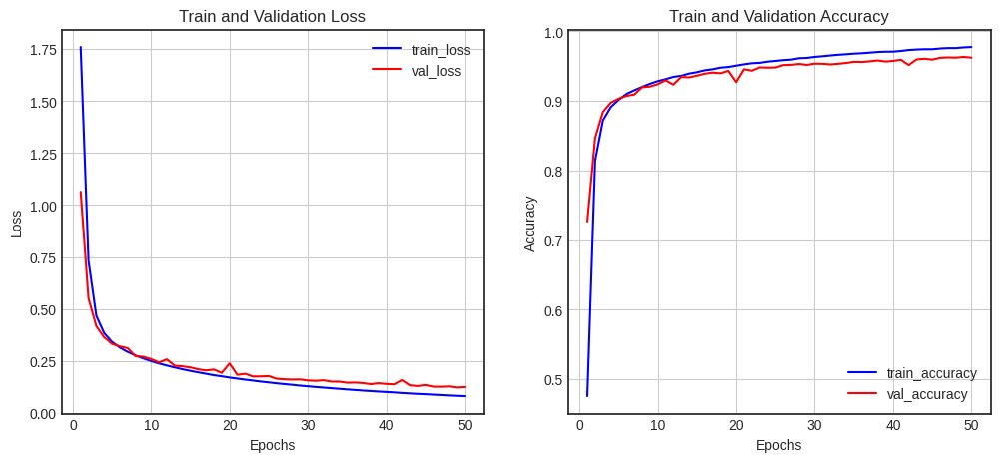

In [62]:
history_dict = history.history

loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(loss) + 1)
fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(epochs, loss, color='blue', label='train_loss')
ax1.plot(epochs, val_loss, color='red', label='val_loss')
ax1.set_title('Train and Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.grid()
ax1.legend()


accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(epochs, accuracy, color='blue', label='train_accuracy')
ax2.plot(epochs, val_accuracy, color='red', label='val_accuracy')
ax2.set_title('Train and Validation Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.grid()
ax2.legend()

plt.show()

#### 모델 평가 및 예측

In [63]:
model.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.1185 - accuracy: 0.9641


[0.11847614496946335, 0.9641000032424927]

In [64]:
pred_ys = model.predict(x_test)
print(pred_ys.shape)

np.set_printoptions(precision=7)
print(pred_ys[0])

313/313 [==============================] - 1s 2ms/step
(10000, 10)
[2.6681957e-06 1.2955020e-07 1.5253662e-04 1.4012550e-03 1.6451237e-09
 1.7732898e-05 4.6064198e-11 9.9838221e-01 1.8819968e-05 2.4572873e-05]


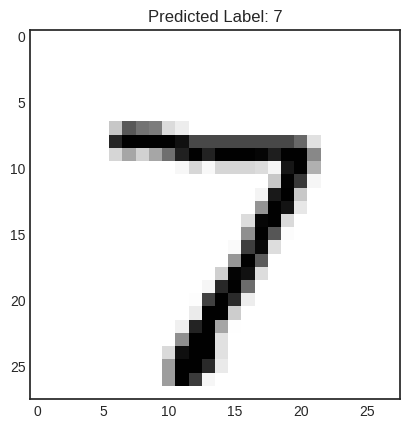

In [65]:
arg_pred_y = np.argmax(pred_ys, axis=1)

plt.imshow(x_test[0])
plt.title('Predicted Label: {}'.format(arg_pred_y[0]))
plt.show()

- 혼동 행렬 (Confusion Matrix)

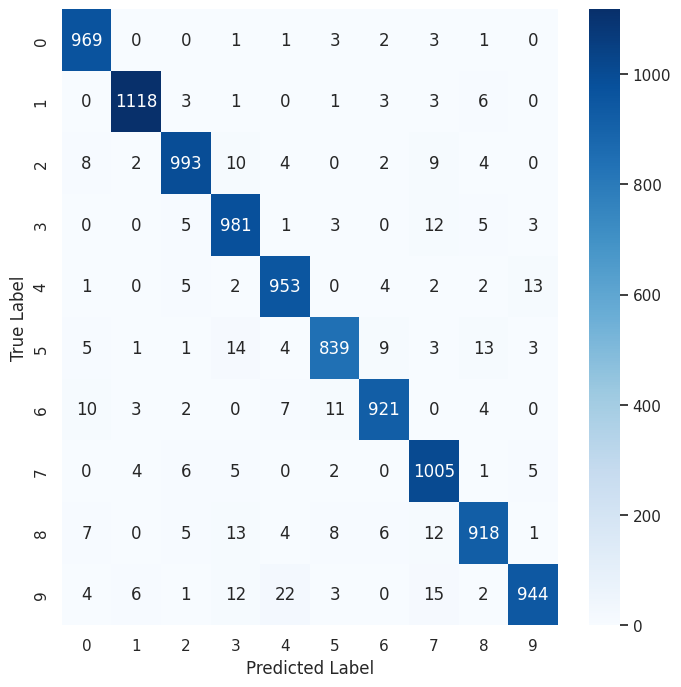

In [66]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
sns.set(style='white')

plt.figure(figsize=(8, 8))
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(pred_ys, axis=-1))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

* 분류 보고서

In [67]:
print(classification_report(np.argmax(y_test, axis=-1), np.argmax(pred_ys, axis=-1)))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.99      0.99      0.99      1135
           2       0.97      0.96      0.97      1032
           3       0.94      0.97      0.96      1010
           4       0.96      0.97      0.96       982
           5       0.96      0.94      0.95       892
           6       0.97      0.96      0.97       958
           7       0.94      0.98      0.96      1028
           8       0.96      0.94      0.95       974
           9       0.97      0.94      0.95      1009

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000



### 모델 저장과 복원

- `save()`
- `load_model()`
- Sequencial API, 함수형 API에서는 모델의 저장 및 로드가 가능하지만 서브클래싱 방식으로는 할 수 없음
- 서브클래싱 방식은 `save_weights()`와 `load_weights()`를 이용해 모델의 파라미터만 저장 및 로드

- JSON 형식
  - `model.to_json()` (저장)
  - `tf.keras.models.model_from_json(file_path)` (복원)

- YAML로 직렬화
  - `model.to_yaml()` (저장)
  - `tf.keras.models.model_from_yaml(file_path)` (복원)


In [68]:
model.save('mnist_model.h5')

In [69]:
loaded_model = models.load_model('mnist_model.h5')
loaded_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense1 (Dense)              (None, 100)               78500     
                                                                 
 dense2 (Dense)              (None, 64)                6464      
                                                                 
 dense3 (Dense)              (None, 32)                2080      
                                                                 
 output (Dense)              (None, 10)                330       
                                                                 
Total params: 87,374
Trainable params: 87,374
Non-trainable params: 0
_________________________________________________________________


In [70]:
pred_ys2 = loaded_model.predict(x_test)
print(pred_ys2.shape)

np.set_printoptions(precision=7)
print(pred_ys2[0])

313/313 [==============================] - 1s 2ms/step
(10000, 10)
[2.6681957e-06 1.2955020e-07 1.5253662e-04 1.4012550e-03 1.6451237e-09
 1.7732898e-05 4.6064198e-11 9.9838221e-01 1.8819968e-05 2.4572873e-05]


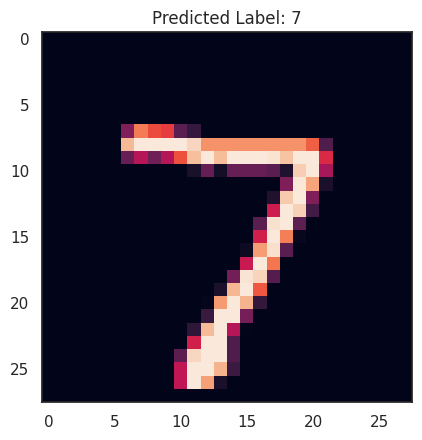

In [71]:
arg_pred_y2 = np.argmax(pred_ys2, axis=1)

plt.imshow(x_test[0])
plt.title('Predicted Label: {}'.format(arg_pred_y2[0]))
plt.show()

### 콜백 (Callbacks)

- `fit()` 함수의 callbacks 매개변수를 사용하여 케라스가 훈련의 시작이나 끝에 호출할 객체 리스트를 지정할 수 있음
- 여러 개 사용 가능
- ModelCheckpoint
  - `tf.keras.callbacks.ModelCheckpoint`
  - 정기적으로 모델의 체크포인트를 저장하고, 문제가 발생할 때 복구하는데 사용
- EarlyStopping
  - `tf.keras.callbacks.EarlyStopping`
  - 검증 성능이 한동안 개선되지 않을 경우 학습을 중단할 때 사용
- LearningRateSchduler
  - `tf.keras.callbacks.LearningRateSchduler`
  - 최적화를 하는 동안 학습률(learning_rate)를 동적으로 변경할 때 사용
- TensorBoard
  - `tf.keras.callbacks.TensorBoard`
  - 모델의 경과를 모니터링할 때 사용


In [72]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, TensorBoard

#### ModelCheckpoint

In [73]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5')
history = model.fit(x_train, y_train, epochs=10,
                    callbacks=[check_point_cb])

Epoch 1/10
1313/1313 [==============================] - 5s 4ms/step - loss: 0.0881 - accuracy: 0.9742
Epoch 2/10
1313/1313 [==============================] - 5s 4ms/step - loss: 0.0823 - accuracy: 0.9757
Epoch 3/10
1313/1313 [==============================] - 5s 3ms/step - loss: 0.0749 - accuracy: 0.9776
Epoch 4/10
1313/1313 [==============================] - 5s 4ms/step - loss: 0.0704 - accuracy: 0.9793
Epoch 5/10
1313/1313 [==============================] - 4s 3ms/step - loss: 0.0648 - accuracy: 0.9813
Epoch 6/10
1313/1313 [==============================] - 5s 4ms/step - loss: 0.0608 - accuracy: 0.9817
Epoch 7/10
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0560 - accuracy: 0.9839
Epoch 8/10
1313/1313 [==============================] - 11s 8ms/step - loss: 0.0525 - accuracy: 0.9848
Epoch 9/10
1313/1313 [==============================] - 7s 5ms/step - loss: 0.0488 - accuracy: 0.9859
Epoch 10/10
1313/1313 [==============================] - 5s 4ms/step - loss: 0.04

최상의 모델만을 저장: `save_best_only=True`

In [74]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5', save_best_only="True")
history = model.fit(x_train, y_train, epochs=10,
                    validation_data=(x_val, y_val),
                    callbacks=[check_point_cb])

Epoch 1/10
1313/1313 [==============================] - 7s 5ms/step - loss: 0.0423 - accuracy: 0.9883 - val_loss: 0.1078 - val_accuracy: 0.9688
Epoch 2/10
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0401 - accuracy: 0.9888 - val_loss: 0.1078 - val_accuracy: 0.9690
Epoch 3/10
1313/1313 [==============================] - 6s 4ms/step - loss: 0.0365 - accuracy: 0.9901 - val_loss: 0.1031 - val_accuracy: 0.9697
Epoch 4/10
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0345 - accuracy: 0.9910 - val_loss: 0.1148 - val_accuracy: 0.9678
Epoch 5/10
1313/1313 [==============================] - 6s 4ms/step - loss: 0.0315 - accuracy: 0.9916 - val_loss: 0.1056 - val_accuracy: 0.9702
Epoch 6/10
1313/1313 [==============================] - 8s 6ms/step - loss: 0.0299 - accuracy: 0.9921 - val_loss: 0.1072 - val_accuracy: 0.9696
Epoch 7/10
1313/1313 [==============================] - 6s 4ms/step - loss: 0.0275 - accuracy: 0.9931 - val_loss: 0.1030 - val_accuracy:

#### EarlyStopping

- 일정 `patience` 동안 검증 세트에 대한 점수가 오르지 않으면 학습을 멈춤
- 모델이 향상되지 않으면 학습이 자동으로 중지되므로, `epochs` 숫자를 크게 해도 무방
- 학습이 끝난 후의 최상의 가중치를 복원하기 때문에 모델을 따로 복원할 필요없음

In [78]:
check_point_cb = ModelCheckpoint('keras_mnist_model.h5', save_best_only=True)
early_stopping_cb = EarlyStopping(patience=3, monitor='val_loss',
                                  restore_best_weights=True)
history = model.fit(x_train, y_train, epochs=50,
                    validation_data=(x_val, y_val),
                    callbacks=[early_stopping_cb])

Epoch 1/50
1313/1313 [==============================] - 7s 6ms/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 0.1228 - val_accuracy: 0.9729
Epoch 2/50
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 0.1236 - val_accuracy: 0.9728
Epoch 3/50
1313/1313 [==============================] - 6s 4ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.1236 - val_accuracy: 0.9729
Epoch 4/50
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.1256 - val_accuracy: 0.9723


#### LearningRateScheduler

* 학습 중에 학습률(learning rate)을 변경시키기 위해 사용

In [79]:
def scheduler(epoch, learning_rate):
  if epoch < 10:
    return learning_rate
  else:
    return learning_rate * tf.math.exp(-0.1)

In [80]:
round(model.optimizer.lr.numpy(), 5)

0.01

In [83]:
lr_scheduler_cb = LearningRateScheduler(scheduler)
history = model.fit(x_train, y_train, epochs=15,
                    callbacks=[lr_scheduler_cb], verbose=0)
round(model.optimizer.lr.numpy(), 5)

0.00607

#### Tensorboard

- 텐서보드를 이용하여 학습과정 모니터링
- 텐서보드를 사용하기 위해 logs 폴더를 만들고, 학습이 진행되는 동안 로그 파일을 생성

In [84]:
log_dir = './logs'
tensor_board_cb = [TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True, write_images=True)]
model.fit(x_train, y_train, batch_size=32, validation_data=(x_val, y_val),
          epochs=30, callbacks=tensor_board_cb)

Epoch 1/30
1313/1313 [==============================] - 7s 5ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.1293 - val_accuracy: 0.9732
Epoch 2/30
1313/1313 [==============================] - 7s 5ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.1296 - val_accuracy: 0.9729
Epoch 3/30
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.1295 - val_accuracy: 0.9731
Epoch 4/30
1313/1313 [==============================] - 7s 5ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.1302 - val_accuracy: 0.9733
Epoch 5/30
1313/1313 [==============================] - 6s 5ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.1303 - val_accuracy: 0.9731
Epoch 6/30
1313/1313 [==============================] - 8s 6ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.1302 - val_accuracy: 0.9733
Epoch 7/30
1313/1313 [==============================] - 9s 7ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.1298 - val_accuracy:

In [85]:
%load_ext tensorboard

* 텐서보드 load가 안된다면 port 번호를 바꿔서 실행
`%tensorboard --logdir {log_dir} port 8000`

In [86]:
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

# 딥러닝 학습 기술


## IMDB 딥러닝 모델 예제

* 영화 사이트 IMDB의 리뷰 데이터
* 텍스트 분류, 감성 분류를 위해 자주 사용하는 데이터
* 리뷰 텍스트와 리뷰가 긍정인 경우 1을 부정인 경우 0으로 표시한 레이블
* 케라스에서는 IMDB 영화 리뷰 데이터를 `imdb.load_data()` 함수를 통해 다운로드 가능

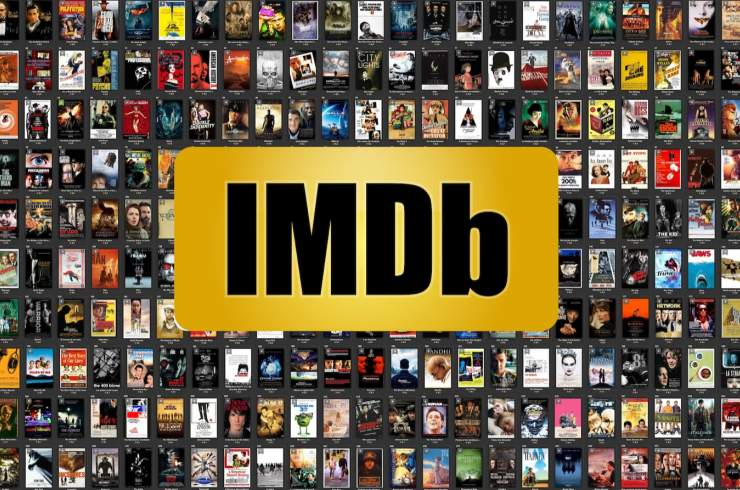

## 과소적합(Underfitting) / 과대적합(Overfitting)

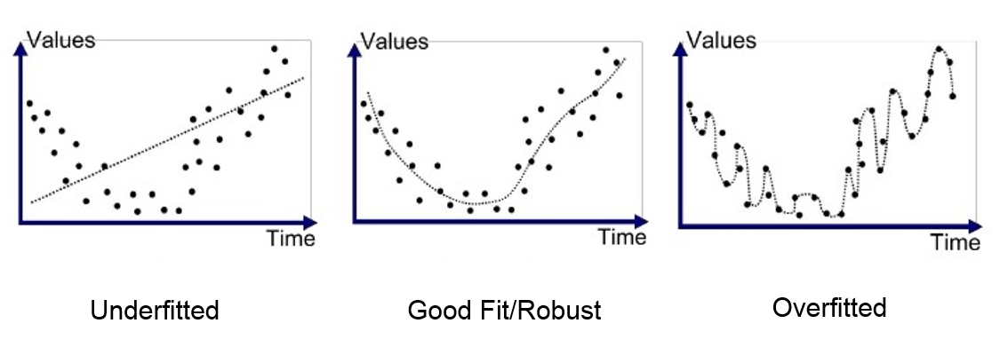

### 과소적합 (Underfitting)

- 학습 데이터를 충분히 학습하지 않아 성능이 매우 안 좋은 경우
- 모델이 지나치게 단순한 경우
- 해결 방안
  - 충분한 학습 데이터 수집
  - 보다 더 복잡한 모델 사용
  - 에폭수(epochs)를 늘려 충분히 학습

### 과대적합 (Overfitting)

- 모델이 학습 데이터에 지나치게 맞추어진 상태
- 새로운 데이터에서는 성능 저하
- 데이터에는 잡음이나 오류가 포함
- 학습 데이터가 매우 적을 경우
- 모델이 지나치게 복잡한 경우 
- 학습 횟수가 매우 많을 경우
- 해결방안
  - 다양한 학습 데이터 수집 및 학습
  - 모델 단순화: 파라미터가 적은 모델을 선택하거나, 학습 데이터의 특성 수를 줄임
  - 정규화(Regularization)을 통한 규칙 단순화
  - 적정한 하이퍼 파라미터 찾기

### 과대적합(overfitting)과 과소적합(underfitting) 방지 방법

* 모델의 크기 축소
* 가중치 초기화(Weight Initializer)
* 옵티마이저(Optimizer)
* 배치 정규화(Batch Normalization)
* 규제화(Regularization)
* 드롭아웃(Dropout)

## 모델 크기 조절

- 가장 단순한 방법
- 모델의 크기를 줄인다는 것은 학습 파라미터의 수를 줄이는 것


### 모델 크기 감소

### 모델 크기 증가

* 볼륨이 큰 신경망일수록 빠르게 훈련데이터 모델링 가능(학습 손실이 낮아짐)
* 과대 적합에는 더욱 민감해짐
* 이는 학습-검증 데이터 손실을 통해 확인 가능

## 옵티마이저(Optimizer)

### 확률적 경사하강법(Stochastic Gradient Descent, SGD)

* 전체를 한번에 계산하지 않고, **확률적**으로 일부 샘플을 뽑아 조금씩 나누어 학습을 시키는 과정  
* 반복할 때마다 다루는 데이터의 수가 적기때문에 한 번 처리하는 속도는 빠름  
* 한 번 학습할 때 필요한 메모리만 있으면 되므로 매우 큰 데이터셋에 대해서도 학습이 가능
* 확률적이기 때문에, 배치 경사하강법보다 불안정
* 손실함수의 최솟값에 이를 때까지 다소 위아래로 요동치면서 이동
* 따라서, 위와 같은 문제 때문에 **미니 배치 경사하강법**(mini-batch gradient descent)로 학습을 진행
* 요즘에는 보통 SGD라고하면 미니 배치 경사하강법을 의미하기도 함
* SGD의 단점: 단순하지만 문제에 따라서 시간이 매우 오래걸림
* SGD 수식

  $\quad W \leftarrow W - \gamma \frac{\partial L}{\partial W}$  
   - $\gamma :\ $ 학습률

  





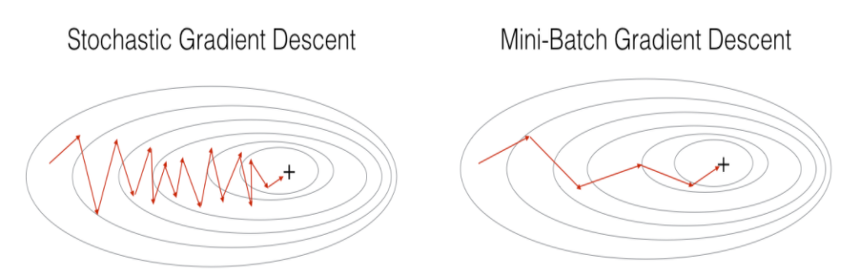

### Momentum

- 운동량을 의미, 관성과 관련
- 공이 그릇의 경사면을 따라서 내려가는 듯한 모습
- 이전의 속도를 유지하려는 성향
- 경사하강을 좀 더 유지하려는 성격을 지님
- 단순히 SGD만 사용하는 것보다 적게 방향이 변함
* Momentum 수식

  $
  \qquad v \ \leftarrow \ \alpha \ v - \gamma \ \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \ v
  $
  - $\alpha\ $ : 관성계수 
  - $v$ :  속도
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : 손실함수에 대한 미분




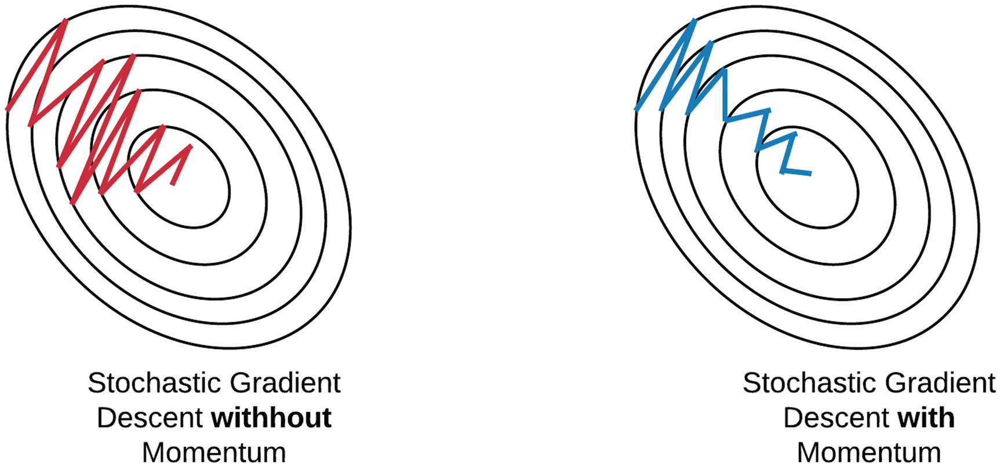

### Nesterov

- 모멘텀의 방향으로 조금 앞선 곳에서 손실함수의 그라디언트를 구함
- 시간이 지날수록 조금 더 빨리 최솟값에 도달
- Nesterov 수식

  $
  \qquad m \ \leftarrow \  \beta m - \eta \bigtriangledown_\theta J(\theta + \beta m) \\
  \qquad \theta \ \leftarrow \ \theta \ + m
  $

  - $h\ $ : 기존 기울기를 제곱하여 더한 값
  - $\eta\ $ : 학습률
  - $\bigtriangledown_\theta J(\theta) \ $ : $\theta$에 대한 미분(그라디언트)

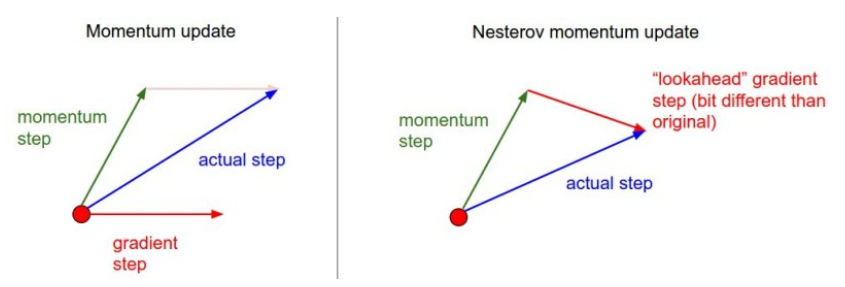

### AdaGrad(Adaptive Gradient)

- 가장 가파른 경사를 따라 빠르게 하강하는 방법
- 학습률을 변화시키며 진행하며 적응적 학습률이라고도 부름
- 경사가 급할 때는 빠르게 변화, 완만할 때는 느리게 변화
- 간단한 문제에서는 좋을 수는 있지만 딥러닝(Deep Learning)에서는 자주 쓰이지 않음
- 학습률이 너무 감소되어 전역최소값(global minimum)에 도달하기 전에 학습이 빨리 종료될 수 있기 때문
- AdaGrad 수식

  $
  \qquad h \ \leftarrow \  h + \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \gamma \frac{1}{\sqrt h} \ \frac{\partial L}{\partial W}
  $
  - $h\ $ : 기존 기울기를 제곱하여 더한 값
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분
  - 과거의 기울기를 제곱하여 계속 더해하기 때문에 학습을 진행할수록 갱신 강도가 약해짐 ($\because \frac{1}{\sqrt h}$)    
  

### RMSProp (Root Mean Square Propagation)

- AdaGrad를 보완하기 위한 방법으로 등장
- 합 대신 지수의 평균값을 활용
- 학습이 안되기 시작하면 학습률이 커져서 잘 되게하고, 학습률이 너무 크면 학습률을 다시 줄임
- RMSProp 수식

  $
  \qquad h \ \leftarrow \  \rho \ h + (1 - \rho)\ \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad W \ \leftarrow \ W \ + \gamma \frac{\partial L}{\partial W} / \ \sqrt{h + \epsilon}
  $
  - $h\ $ : 기존 기울기를 제곱하여 업데이트 계수를 곱한 값과 업데이트 계수를 곱한 값을 더해줌 
  - $\rho\ $ : 지수 평균의 업데이트 계수
  - $\gamma\ $ : 학습률
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분

### Adam (Adaptive Moment Estimation)

- 모멘텀 최적화와 RMSProp의 아이디어를 합친 것
- 지난 그래디언트의 지수 감소 평균을 따르고(Momentum), 지난 그레디언트 제곱의 지수 감소된 평균(RMSProp)을 따름
- 가장 많이 사용되는 최적화 방법
- Adam 수식

  $
  \qquad t \ \leftarrow \ t + 1 \\
  \qquad m_t \ \leftarrow \  \beta_1 \ m_{t-1} - (1 - \beta_1)\ \frac{\partial L}{\partial W}  \\
  \qquad v_t \ \leftarrow \ \beta_2 \ v_{t-1} + (1 - \beta_2) \frac{\partial L}{\partial W} \odot \frac{\partial L}{\partial W} \\
  \qquad \hat{m_t} \ \leftarrow \frac{m_t}{1 - \beta_1^t} \\
  \qquad \hat{v_t} \ \leftarrow \frac{v_t}{1 - \beta_2^t} \\
  \qquad W_t \ \leftarrow \ W_{t-1} \ + \gamma \ \hat{m_t}\  / \sqrt{\hat{v_t} + \epsilon}
  $
  - $\beta\ $ : 지수 평균의 업데이트 계수
  - $\gamma\ $ : 학습률
  - $\beta_1 \approx 0.9\ ,\ \ \beta_2 \approx 0.999$
  - $\frac{\partial L}{\partial W}\ $ : $W$에 대한 미분

### 최적화 Optimizer 비교

<img src="https://user-images.githubusercontent.com/11681225/50016682-39742a80-000d-11e9-81da-ab0406610b9c.gif" width="700">

<img src="https://img1.daumcdn.net/thumb/R720x0.q80/?scode=mtistory2&fname=http%3A%2F%2Fcfile25.uf.tistory.com%2Fimage%2F222B4F4F562BD0330EA41C">

## 가중치 초기화(Weights Initialization)

* 가중치 초기화 시각화: https://www.deeplearning.ai/ai-notes/initialization/

### 가중치 소실(Gradient Vanishing)

- 활성화함수가 Sigmoid 함수 일 때, 은닉층의 갯수가 늘어 날수록 가중치가 역전파되면서 가중치 소실문제 발생
  - 0 ~ 1 사이의 값으로 출력되면서 0 또는 1에 가중치 값이 퍼짐  
    이는 <u>미분값이 점점 0에 가까워짐</u>을 의미하기도 함
  - **ReLU 함수 등장(비선형 함수)**

- 가중치 초기화 문제(은닉층의 활성화값 분포)
  - 가중치의 값이 일부 값으로 치우치게 되면, 활성화 함수를 통과한 값이 치우치게 되고, 표현할 수 있는 신경망의 수가 적어짐
  - 따라서, 활성화값이 골고루 분포되는 것이 중요

![](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F278186%2Fd158ec3585bc1551d9f3a03ae13a3a73%2Fvanishing%20gradient%20problem.png?generation=1574233763365617&alt=media)

###  선형 함수에서 가중치 초기화

#### 초기값 : 0 (zeros)

- 학습이 올바르게 진행되지 않음
- 0으로 설정하면 오차역전파법에서 모든 가중치의 값이 똑같이 갱신됨

#### 초기값 : 균일분포(Uniform)

- 활성화 값이 균일하지 않음(활성화함수 : sigmoid)
- 역전파로 전해지는 기울기값이 사라짐

#### 초기값 : 정규분포(nomalization)

- 활성화함수를 통과하면 양쪽으로 퍼짐
- 0과 1에 퍼지면서 기울기 소실문제(gradient vanishing) 발생

* 아주 작은 정규분포값으로 가중치 초기화
  - 0과 1로 퍼치지는 않았고, 한 곳에 치우쳐 짐
  - 해당 신경망이 표현할 수 있는 문제가 제한됨

#### 초기값 : Xavier (Glorot)

- 은닉층의 노드의 수가 n이라면 표준편차가 $\frac{1}{\sqrt{n}}$인 분포
- 더 많은 가중치에 역전파가 전달 가능하고, 비교적 많은 문제를 표현할 수 있음
- 활성화 함수가 **선형**인 함수일 때 매우 적합

#### 초기값 : Xavier (Glorot) - tanh

- 활성화 함수: tanh
- sigmoid 함수보다 더 깔끔한 종모양으로 분포  


### 비선형 함수에서의 가중치 초기화

#### 초기값: 0 (Zeros)

- 활성화함수: ReLU

#### 초기값: 정규분포(Nomalization)

- 활성화함수 : ReLU

* 표준편차: 0.01

#### 초기값 : Xavier (Glorot)

#### 초기값 : He

- 표준편차가 $\sqrt{\frac{2}{n}}$인 분포
- 활성화값 분포가 균일하게 분포되어 있음
- 활성화함수가 ReLU와 같은 **비선형**함수 일 때 더 적합하다고 알려진 분포

### 초기화 전략

- Glorot Initialization (Xavier)
  - 활성화 함수  
    - 없음
    - tanh
    - sigmoid
    - softmax

- He Initialization 
  - 활성화 함수  
    - ReLU
    - LeakyReLU
    - ELU 등

    

## 배치 정규화 (Batch Normalization)

- 모델에 주입되는 샘플들을 균일하게 만드는 방법
- 가중치의 활성화값이 적당히 퍼지게끔 '강제'로 적용시키는 것
- 미니배치 단위로 데이터의 평균이 0, 표준편차가 1로 정규화
- 학습을 빨리 진행할 수 있음
- 학습 후 새로운 데이터에 잘 일반화 할 수 있도록 도와줌
- 초기값에 크게 의존하지 않아도 됨
- 과대적합 방지
- 데이터 전처리 단계에서 진행해도 되지만 정규화가 되어서 layer에 들어갔다는 보장이 없음
- 주로 **Dense** 또는 **Conv2D** Layer 후, **활성화 함수**이전에 놓임

![](https://www.jeremyjordan.me/content/images/2018/01/Screen-Shot-2018-01-23-at-2.27.20-PM.png)

## 규제화(Regularization) - 가중치 감소

- 과대적합(Overfitting, 오버피팅)을 방지하는 방법 중 하나
- 과대적합은 가중치의 매개변수 값이 커서 발생하는 경우가 많음  
  이를 방지하기 위해 **큰 가중치 값에 큰 규제를 가하는 것**
- 규제란 가중치의 절댓값을 가능한 작게 만드는 것으로, 가중치의 모든 원소를 0에 가깝게 하여 모든 특성이 출력에 주는 영향을 최소한으로 만드는 것(기울기를 작게 만드는 것)을 의미
- 가중치의 분포가 더 균일하게 됨
- 복잡한 네트워크 일수록 네트워크의 복잡도에 제한을 두어 가중치가 작은 값을 가지도록 함
- 규제란 과대적합이 되지 않도록 모델을 강제로 제한한다는 의미
- 적절한 규제값을 찾는 것이 중요

- 네트워크 손실함수에 큰 가중치와 연관된 비용을 추가
  - L1 규제: 가중치의 절댓값에 비례하는 비용이 추가
  - L2 규제: 가중치의 제곱에 비례하는 비용이 추가(흔히 가중치 감쇠라고도 불림)
  - 위 두 규제가 합쳐진 경우도 존재


### L2 규제

- 가중치의 제곱합
- 손실 함수일정 값을 더함으로써 과적합을 방지
- $\lambda$ 값이 크면 가중치 감소가 커지고, 작으면 가하는 규제가 적어진다.
- 더 Robust한 모델을 생성하므로 L1보다 많이 사용됨

  $\qquad Cost = \frac{1}{n} \sum{^n}_{i=1} {L(y_i, \hat{y_i}) + \frac{\lambda}{2}w^2}$

  $\quad L(y_i, \hat{y_i})$ : 기존 Cost Function

### L1 규제

- 가중치의 절대값합
- L2 규제와 달리 어떤 가중치는 0이 되는데 이는 모델이 가벼워짐을 의미

  $\qquad Cost = \frac{1}{n} \sum{^n}_{i=1} {L(y_i, \hat{y_i}) + \frac{\lambda}{2}|w|}$

  $\quad L(y_i, \hat{y_i})$ : 기존 Cost Function

### L1 L2 규제

* 규제 방법 비교

## 드롭아웃(Dropout)

- 신경망을 위해 사용되는 규제 기법 중 가장 효과적이고 널리 사용되는 방법
- 과적합을 방지하기 위한 방법
- 학습할 때 사용하는 노드의 수를 전체 노드 중에서 일부만을 사용
- 신경망의 레이어에 드롭아웃을 적용하면 훈련하는 동안 무작위로 층의 일부 특성(노드)를 제외
  - 예를 들어, [1.0, 3.2, 0.6, 0.8, 1.1] 라는 벡터에 대해 드롭아웃을 적용하면 **무작위로 0으로 바뀜** $\rightarrow$ [0, 3.2, 0.6, 0.8, 0]
  - 보통 0.2 ~ 0.5 사이의 비율로 지정됨
- 테스트 단계에서는 그 어떤 노드도 드롭아웃 되지 않고, 대신 해당 레이어의 출력 노드를 드롭아웃 비율에 맞게 줄여줌

  <img src="https://miro.medium.com/max/981/1*EinUlWw1n8vbcLyT0zx4gw.png" width="600">

## 하이퍼 파라미터(Hyper Parameter)

- 사람이 직접 설정해야하는 매개변수
- 학습이 되기전 미리 설정되어 상수취급

### 학습률(Learning Rate)
- 학습률에 따라 학습정도가 달라짐
- 적절한 학습률을 찾는 것이 핵심

### 학습 횟수(Epochs)
- 학습 횟수를 너무 작게, 또는 너무 크게 지정하면 과소적합 또는 과대적합 발생
- 여러번 진행하면서 최적의 학습 횟수(epochs)값을 찾아야함

### 미니배치 크기(Mini Batch Size)
- 미니 배치 학습
  - 한번 학습할 때 메모리의 부족현상을 막기 위해 전체 데이터의 일부를 여러번 학습하는 방식
- 한번 학습할 때마다 얼마만큼의 미니배치 크기를 사용할지 결정
- 배치 크기가 작을수록 학습 시간이 많이 소요되고, 클수록 학습 시간이 학습 시간은 적게 소요된다.  
  

### 검증데이터(Validation Data)
- 주어진 데이터를 학습 + 검증 + 테스트 데이터로 구분하여 과적합을 방지
- 일반적으로 전체 데이터의 2~30%를 테스트 데이터, 나머지에서 20%정도를 검증용 데이터, 남은 부분을 학습용 데이터로 사용

  <img src="https://miro.medium.com/max/1400/1*4G__SV580CxFj78o9yUXuQ.png" width="600">


## Fashion MNIST 모델

<img src="https://www.tensorflow.org/tutorials/keras/classification_files/output_oZTImqg_CaW1_0.png?hl=ko" width="500">


### 모듈 임포트

### 데이터 로드

### 데이터 전처리

- Normalization
- Flatten
- loss='sparse_categorical_crossentropy'

### 모델 구성 (함수형 API)

### 모델 컴파일 및 학습

### 모델 평가 및 예측

- 혼동 행렬 (Confusion Matrix)

- 분류 보고서